# Exploration of dimensionality reduction for image analysis
**Goal:**  Umap projections of all cells, with and without morphology features
**Input:**  Adata objects from 991 and 992     
**Output:** Plots 
**Author:** Jose Nimo    
**Date_of_creation:** 12.05.2025     
**Date_of_latest_modification:** 12.05.2025    
**Status:** Started

In [1]:
import os,sys,time
from loguru import logger 

# import scimap as sm

import numpy as np
import pandas as pd
import shapely
import geopandas as gpd
import anndata as ad

import pyarrow
import ast

#plotting
import matplotlib.pyplot as plt
import seaborn as sns

#custom functions
sys.path.append(os.path.abspath('/Users/jnimoca/Jose_BI/1_Pipelines/openDVP/src/'))
from opendvp import anndata_utils, filtering, imaging, utils
import importlib

for package in [np,pd,gpd,ad]:
    print(f"{package.__name__} {package.__version__}")

numpy 1.26.4
pandas 2.2.3
geopandas 1.0.1
anndata 0.10.9


## Load data

In [2]:
adata_991 = ad.read_h5ad("../data/perSample/991/adata_checkpoints/7_adata_pheno/20250302_1823_7_adata_pheno_adata.h5ad")
adata_992 = ad.read_h5ad("../data/perSample/992/adata_checkpoints/7_adata_pheno/20250303_1112_7_adata_pheno_adata.h5ad")

In [3]:
adata_991

AnnData object with n_obs × n_vars = 610182 × 8
    obs: 'CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity', '991', 'artefact', 'mean_DAPI_bg_above_100', 'mean_DAPI_bg_below_3162', 'Area_filter_nottoobig', 'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio', 'DAPI_ratio_pass_nottoolow', 'DAPI_ratio_pass_nottoohigh', 'DAPI_ratio_pass', 'filtering', 'imageid', 'phenotype'
    var: 'math', 'marker'
    uns: 'gates'
    layers: 'log'

These datasets are filtered, only the features used for phenotyping are present.
To use morphology markers I gotta map these phenotypes via CellID to raw data, and then umap them.

map all features to phenotyped cells by Cell ID    
[ ] get adata with all features and Cell ID 

In [5]:
adata = ad.read_h5ad("../data/perSample/991/adata_checkpoints/0_init/20250302_1751_0_init_adata.h5ad")
adata

/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 685805 × 75
    obs: 'CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity'
    var: 'math', 'marker'

actually, I forgot that morphological information was stored in the adata.obs dataframe, therefore it is already there

In [6]:
adata_991

AnnData object with n_obs × n_vars = 610182 × 8
    obs: 'CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity', '991', 'artefact', 'mean_DAPI_bg_above_100', 'mean_DAPI_bg_below_3162', 'Area_filter_nottoobig', 'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio', 'DAPI_ratio_pass_nottoolow', 'DAPI_ratio_pass_nottoohigh', 'DAPI_ratio_pass', 'filtering', 'imageid', 'phenotype'
    var: 'math', 'marker'
    uns: 'gates'
    layers: 'log'

In [11]:
adata_991.X
adata_991.X

array([[0.21742973, 0.44529233, 0.70637849, ..., 0.39204294, 0.29905066,
        0.        ],
       [0.23256919, 0.44118909, 0.63535207, ..., 0.42588919, 0.33890416,
        0.        ],
       [0.21547293, 0.46621332, 0.79489769, ..., 0.40280093, 0.31181518,
        0.        ],
       ...,
       [0.44046348, 0.73006868, 0.33984735, ..., 0.41861665, 0.39950767,
        0.        ],
       [0.30901161, 0.49528749, 0.15396963, ..., 0.40208256, 0.32724244,
        0.01891288],
       [0.34200699, 0.64433972, 0.10828109, ..., 0.37578541, 0.3426251 ,
        0.        ]])

In [12]:
adata_991.obs

,CellID,Y_centroid,X_centroid,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity,...,Area_filter_nottoobig,Area_filter_nottoolow,Area_filter,DAPI_ratio,DAPI_ratio_pass_nottoolow,DAPI_ratio_pass_nottoohigh,DAPI_ratio_pass,filtering,imageid,phenotype
0,1,29410.806452,35874.857801,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615,...,True,True,True,0.291466,True,True,True,True,991,Cancer_cells
1,2,29445.080408,36162.243140,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109,...,True,True,True,0.353388,True,True,True,True,991,Cancer_cells
2,3,29505.171707,38455.235122,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602,...,True,True,True,0.234700,True,True,True,True,991,Cancer_cells
3,4,29539.721673,35060.844867,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406,...,True,True,True,0.225623,True,True,True,True,991,CD4_Tcells
4,5,29982.642779,36765.660558,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743,...,True,True,True,0.217717,True,True,True,True,991,Cancer_cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685800,685801,40389.067593,46087.962963,1080.0,56.372404,25.352581,0.893163,1.002754,141.610173,0.961710,...,True,True,True,0.247511,True,True,True,True,991,COL1A1_cells
685801,685802,40382.629182,47716.017658,1076.0,41.856049,34.076776,0.580666,1.330143,129.396970,0.951370,...,True,True,True,0.189921,True,True,True,True,991,Cancer_cells
685802,685803,40382.072917,48436.798177,768.0,33.256837,29.969709,0.433488,0.983058,105.254834,0.957606,...,True,True,True,0.244976,True,True,True,True,991,CD8_Tcells
685803,685804,40383.786948,45011.021113,1042.0,45.051210,31.924524,0.705583,1.218499,133.189863,0.964815,...,True,True,True,0.205267,True,True,True,True,991,Unknown


# attempt to run umap in dummy dataset

In [14]:
import umap
import scanpy as sc
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [35]:
# 1. Load PBMC3k dataset from Scanpy
adata = sc.datasets.pbmc3k()
# 2. Preprocessing: Filter & normalize
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes=500, subset=True)

In [36]:
# 3. Standardize features (Z-score)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(adata.X.toarray())  # .X is sparse

In [37]:
# 4. Run UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
embedding = reducer.fit_transform(X_scaled)

/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [40]:
embedding.shape

(2700, 2)

In [38]:
# 5. Save to AnnData
adata.obsm["X_umap_custom"] = embedding
adata.uns["umap_params_custom"] = reducer.get_params()

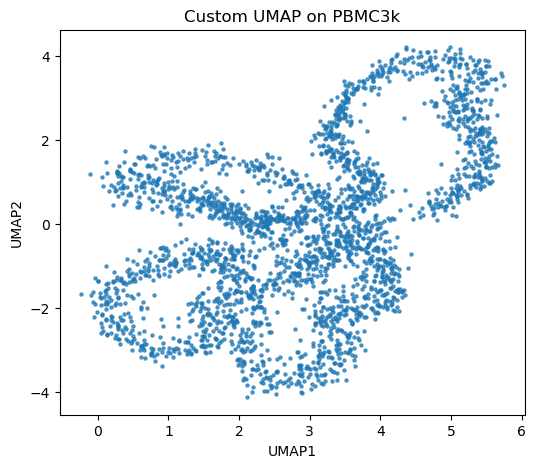

In [39]:
# 6. Plot
plt.figure(figsize=(6, 5))
plt.scatter(embedding[:, 0], embedding[:, 1], s=5, alpha=0.7)
plt.title("Custom UMAP on PBMC3k")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.show()

In [45]:
import scanpy as sc
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np

# Load and preprocess PBMC3k dataset
adata = sc.datasets.pbmc3k()
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, n_top_genes=500, subset=True)

In [46]:
# Z-score standardization (dense needed)
X = adata.X.toarray()  # Be careful with memory on large data
X_scaled = StandardScaler().fit_transform(X)

In [47]:
# Define grid parameters
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.1, 0.5, 0.9]

/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed

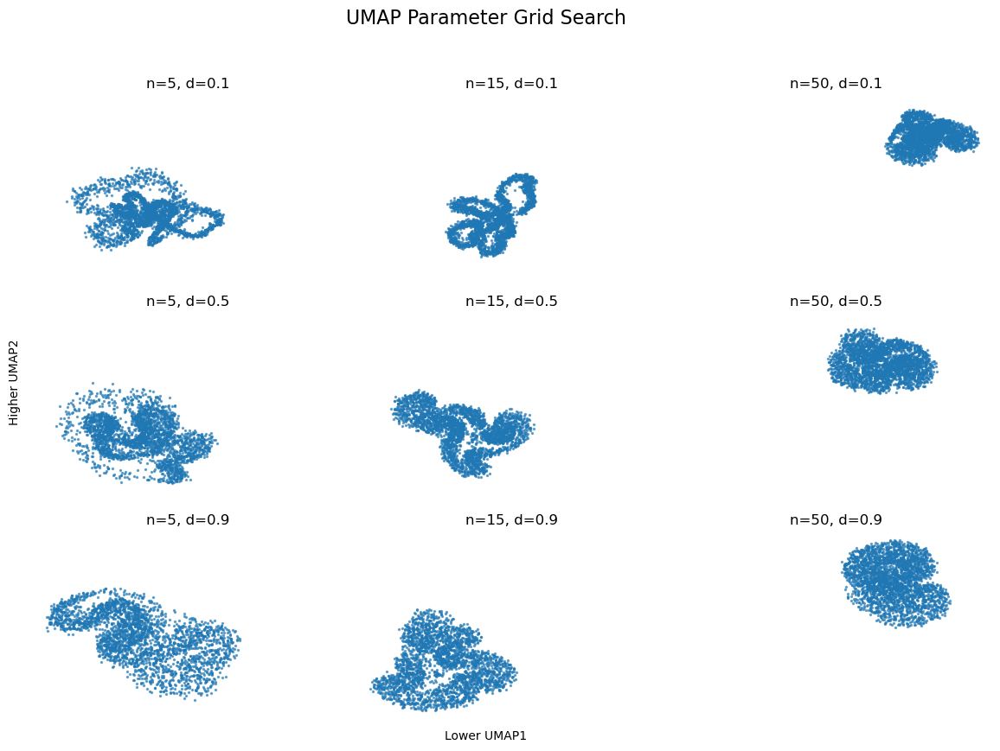

In [48]:
# Create plot grid
fig, axes = plt.subplots(len(min_dist_list), len(n_neighbors_list), figsize=(12, 9), sharex=True, sharey=True)

# Loop over grid
for i, min_dist in enumerate(min_dist_list):
    for j, n_neighbors in enumerate(n_neighbors_list):
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
        embedding = reducer.fit_transform(X_scaled)

        ax = axes[i, j]
        ax.scatter(embedding[:, 0], embedding[:, 1], s=2, alpha=0.6)
        ax.set_title(f"n={n_neighbors}, d={min_dist}")
        ax.axis('off')

# Global labels
fig.suptitle("UMAP Parameter Grid Search", fontsize=16)
fig.text(0.5, 0.04, "Lower UMAP1", ha='center')
fig.text(0.04, 0.5, "Higher UMAP2", va='center', rotation='vertical')
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()

In [ ]:
# ok lets get my actual dataset ready

In [4]:
adata_991 = ad.read_h5ad("../data/perSample/991/adata_checkpoints/7_adata_pheno/20250302_1823_7_adata_pheno_adata.h5ad")

In [5]:
adata_991

AnnData object with n_obs × n_vars = 610182 × 8
    obs: 'CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity', '991', 'artefact', 'mean_DAPI_bg_above_100', 'mean_DAPI_bg_below_3162', 'Area_filter_nottoobig', 'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio', 'DAPI_ratio_pass_nottoolow', 'DAPI_ratio_pass_nottoohigh', 'DAPI_ratio_pass', 'filtering', 'imageid', 'phenotype'
    var: 'math', 'marker'
    uns: 'gates'
    layers: 'log'

In [6]:
df_markers = pd.DataFrame(data=adata_991.X, columns=adata_991.var_names, index=adata_991.obs['CellID'])

In [7]:
columns = ['CellID', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent']
df_to_scale = adata_991.obs[columns].copy()
df_to_scale = df_to_scale.set_index('CellID')

In [8]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(X=df_to_scale.values)
df_scaled.shape

(610182, 6)

In [9]:
df_morpho = pd.DataFrame(data=df_scaled, columns=df_to_scale.columns, index=df_to_scale.index)
df_morpho.head()

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent
CellID,,,,,,
1,0.243202,0.635682,0.270999,0.969196,0.014584,0.481331
2,0.253644,0.228982,0.400706,0.620663,0.550931,0.232230
3,0.135741,0.143535,0.321907,0.528427,0.389660,0.178409
4,0.198825,0.318514,0.236022,0.902650,0.039377,0.240158
5,0.708070,0.513372,0.654609,0.740551,0.579961,0.527224


In [10]:
df_m = pd.merge(left=df_markers, right=df_morpho, left_on="CellID", right_on="CellID")

In [11]:
df_m

,mean_Vimentin,mean_CD3e,mean_panCK,mean_CD8,mean_COL1A1,mean_CD20,mean_CD68,mean_Ki67,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent
CellID,,,,,,,,,,,,,,
1,0.217430,0.445292,0.706378,0.443221,0.457555,0.392043,0.299051,0.000000,0.243202,0.635682,0.270999,0.969196,0.014584,0.481331
2,0.232569,0.441189,0.635352,0.423866,0.542440,0.425889,0.338904,0.000000,0.253644,0.228982,0.400706,0.620663,0.550931,0.232230
3,0.215473,0.466213,0.794898,0.445378,0.473647,0.402801,0.311815,0.000000,0.135741,0.143535,0.321907,0.528427,0.389660,0.178409
4,0.309152,0.556337,0.227288,0.466315,0.443738,0.431272,0.305019,0.000000,0.198825,0.318514,0.236022,0.902650,0.039377,0.240158
5,0.290441,0.483283,0.701336,0.456075,0.467879,0.413881,0.338755,0.000000,0.708070,0.513372,0.654609,0.740551,0.579961,0.527224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685801,0.349347,0.580561,0.616782,0.481668,0.648872,0.418773,0.394006,0.005254,0.147705,0.279106,0.195043,0.909245,0.819187,0.210104
685802,0.365076,0.540715,0.739696,0.554223,0.465899,0.404583,0.345634,0.000000,0.146835,0.156808,0.320208,0.582892,0.923399,0.172047
685803,0.440463,0.730069,0.339847,0.553126,0.552363,0.418617,0.399508,0.000000,0.079835,0.084360,0.261284,0.429189,0.812918,0.096819


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from itertools import product

def plot_umap_grid_results(
    grid_results,
    param_names=("n_neighbors", "min_dist"),
    color_series: pd.Series = None,
    color_dict: dict = None,
    figsize_per_plot=(5, 5),
    point_size=10
):
    """
    Plot UMAP embeddings from grid search results in a parameter grid layout.

    Parameters:
    - grid_results: list of dicts with keys 'embedding' and 'params'.
    - param_names: tuple of two parameter names used in the grid search.
    - color_series: pd.Series with index matching data points.
    - color_dict: optional dict mapping categorical labels to colors.
    - figsize_per_plot: tuple (width, height) per subplot.
    - point_size: marker size.
    """
    # Determine unique parameter values
    param_values = {p: sorted({r["params"][p] for r in grid_results}) for p in param_names}
    n_rows, n_cols = len(param_values[param_names[0]]), len(param_values[param_names[1]])

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize_per_plot[0]*n_cols, figsize_per_plot[1]*n_rows), squeeze=False)

    # Create lookup for parameter combinations
    param_grid = {(r["params"][param_names[0]], r["params"][param_names[1]]): r for r in grid_results}

    for i, val1 in enumerate(param_values[param_names[0]]):
        for j, val2 in enumerate(param_values[param_names[1]]):
            ax = axes[i][j]
            result = param_grid.get((val1, val2))
            if result is None:
                ax.axis("off")
                continue

            emb = pd.DataFrame(result["embedding"], columns=["UMAP1", "UMAP2"])
            if color_series is not None:
                emb["category"] = color_series.values
                sns.scatterplot(
                    data=emb,
                    x="UMAP1", y="UMAP2",
                    hue="category",
                    palette=color_dict,
                    ax=ax,
                    s=point_size,
                    linewidth=0,
                    legend=False
                )
            else:
                ax.scatter(emb["UMAP1"], emb["UMAP2"], s=point_size, c='black')

            ax.set_title(f'{param_names[0]}={val1}, {param_names[1]}={val2}')
            ax.set_xticks([])
            ax.set_yticks([])

    # Add global legend if applicable
    if color_series is not None:
        handles, labels = ax.get_legend_handles_labels()
        if handles:
            fig.legend(handles, labels, loc="center right", title=color_series.name)

    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()

In [14]:
df = pd.merge(left=df_m, right=adata_991.obs[['CellID', "phenotype"]], left_on="CellID", right_on="CellID")
df.set_index("CellID", inplace=True)
df

,mean_Vimentin,mean_CD3e,mean_panCK,mean_CD8,mean_COL1A1,mean_CD20,mean_CD68,mean_Ki67,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,phenotype
CellID,,,,,,,,,,,,,,,
1,0.217430,0.445292,0.706378,0.443221,0.457555,0.392043,0.299051,0.000000,0.243202,0.635682,0.270999,0.969196,0.014584,0.481331,Cancer_cells
2,0.232569,0.441189,0.635352,0.423866,0.542440,0.425889,0.338904,0.000000,0.253644,0.228982,0.400706,0.620663,0.550931,0.232230,Cancer_cells
3,0.215473,0.466213,0.794898,0.445378,0.473647,0.402801,0.311815,0.000000,0.135741,0.143535,0.321907,0.528427,0.389660,0.178409,Cancer_cells
4,0.309152,0.556337,0.227288,0.466315,0.443738,0.431272,0.305019,0.000000,0.198825,0.318514,0.236022,0.902650,0.039377,0.240158,CD4_Tcells
5,0.290441,0.483283,0.701336,0.456075,0.467879,0.413881,0.338755,0.000000,0.708070,0.513372,0.654609,0.740551,0.579961,0.527224,Cancer_cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685801,0.349347,0.580561,0.616782,0.481668,0.648872,0.418773,0.394006,0.005254,0.147705,0.279106,0.195043,0.909245,0.819187,0.210104,COL1A1_cells
685802,0.365076,0.540715,0.739696,0.554223,0.465899,0.404583,0.345634,0.000000,0.146835,0.156808,0.320208,0.582892,0.923399,0.172047,Cancer_cells
685803,0.440463,0.730069,0.339847,0.553126,0.552363,0.418617,0.399508,0.000000,0.079835,0.084360,0.261284,0.429189,0.812918,0.096819,CD8_Tcells


In [15]:
subsample = df.sample(10000)
ss_X = subsample.iloc[:,:-1]
ss_label = subsample.iloc[:,-1]

In [19]:
ss_X

,mean_Vimentin,mean_CD3e,mean_panCK,mean_CD8,mean_COL1A1,mean_CD20,mean_CD68,mean_Ki67,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent
CellID,,,,,,,,,,,,,,
139901,0.359506,0.445673,0.031081,0.420878,0.416084,0.312607,0.296926,0.0,0.151621,0.197742,0.273489,0.761280,0.416890,0.175476
81456,0.340214,0.476421,0.009131,0.394042,0.433483,0.380112,0.031869,0.0,0.283881,0.270819,0.421751,0.675437,0.359533,0.284042
279062,0.448312,0.533697,0.066460,0.436822,0.436420,0.403419,0.387994,0.0,0.103546,0.148418,0.233370,0.736490,0.017331,0.129805
260075,0.404658,0.409039,0.253003,0.416997,0.495159,0.365473,0.345929,0.0,0.103763,0.122220,0.262337,0.608851,0.570756,0.120052
133755,0.434705,0.697735,0.557137,0.560283,0.488664,0.414025,0.361464,0.0,0.062432,0.071625,0.237416,0.449253,0.022241,0.082216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269841,0.398146,0.508369,0.412519,0.418411,0.431573,0.393815,0.458653,0.0,0.144877,0.173956,0.311850,0.651398,0.900155,0.183755
679768,0.321165,0.447168,0.078138,0.411970,0.413342,0.338549,0.334813,0.0,0.175767,0.141170,0.397245,0.149622,0.099546,0.185268
421639,0.155072,0.340159,0.055806,0.373990,0.407124,0.236131,0.288815,0.0,0.188384,0.183310,0.354410,0.588616,0.334237,0.203208


In [20]:
ss_X.mean(axis=0)

mean_Vimentin      0.308994
mean_CD3e          0.475006
mean_panCK         0.378905
mean_CD8           0.434531
mean_COL1A1        0.453031
mean_CD20          0.381235
mean_CD68          0.323766
mean_Ki67          0.088086
Area               0.190965
MajorAxisLength    0.212817
MinorAxisLength    0.312541
Eccentricity       0.685524
Orientation        0.493665
Extent             0.204475
dtype: float64

In [16]:
from tqdm import tqdm
from sklearn.model_selection import ParameterGrid
import umap

param_grid = {
    'n_neighbors': [5, 25, 50, 100],
    'min_dist': [0.001, 0.01, 0.1, 0.2, 0.5],
    'n_components': [2],
    'metric': ['euclidean']
}

grid = list(ParameterGrid(param_grid))

results = []
with tqdm(total=len(grid), desc="UMAP grid search") as pbar:
    for params in grid:
        reducer = umap.UMAP(**params)
        embedding = reducer.fit_transform(ss_X)
        results.append({
            'embedding': embedding,
            'params': params,
        })
        
        # Update progress bar with current params (brief version)
        brief_params = {k: params[k] for k in ['n_neighbors', 'min_dist']}
        pbar.set_postfix(brief_params)
        pbar.update(1)

UMAP grid search:   0%|          | 0/20 [00:00<?, ?it/s]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
UMAP grid search:   5%|▌         | 1/20 [00:08<02:37,  8.27s/it, n_neighbors=5, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
UMAP grid search:  10%|█         | 2/20 [00:11<01:32,  5.13s/it, n_neighbors=25, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-package

In [17]:
import json
with open("../assets/pheno_colors.json") as f:
    color_dict = json.load(f)

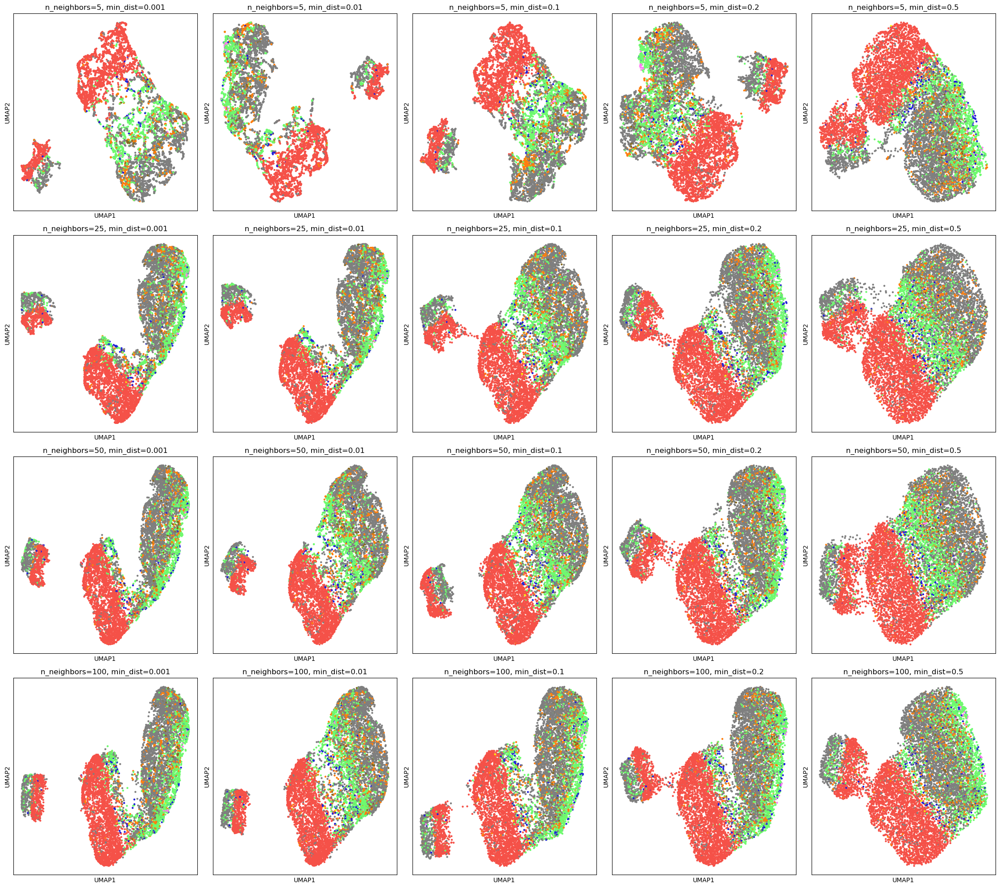

In [18]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=ss_label,
    color_dict=color_dict,
    )

In [137]:
subsample = df.sample(100000)
ss_X = subsample.iloc[:,:-1]
ss_label = subsample.iloc[:,-1]

param_grid = {
    'n_neighbors': [5, 25, 50, 100],
    'min_dist': [0.001, 0.01, 0.1, 0.2, 0.5],
    'n_components': [2],
    'metric': ['euclidean']
}

grid = list(ParameterGrid(param_grid))

results = []
with tqdm(total=len(grid), desc="UMAP grid search") as pbar:
    for params in grid:
        reducer = umap.UMAP(**params)
        embedding = reducer.fit_transform(ss_X)
        results.append({
            'embedding': embedding,
            'params': params,
        })
        
        # Update progress bar with current params (brief version)
        brief_params = {k: params[k] for k in ['n_neighbors', 'min_dist']}
        pbar.set_postfix(brief_params)
        pbar.update(1)

UMAP grid search: 100%|██████████| 20/20 [20:32<00:00, 61.65s/it, n_neighbors=100, min_dist=0.5] 


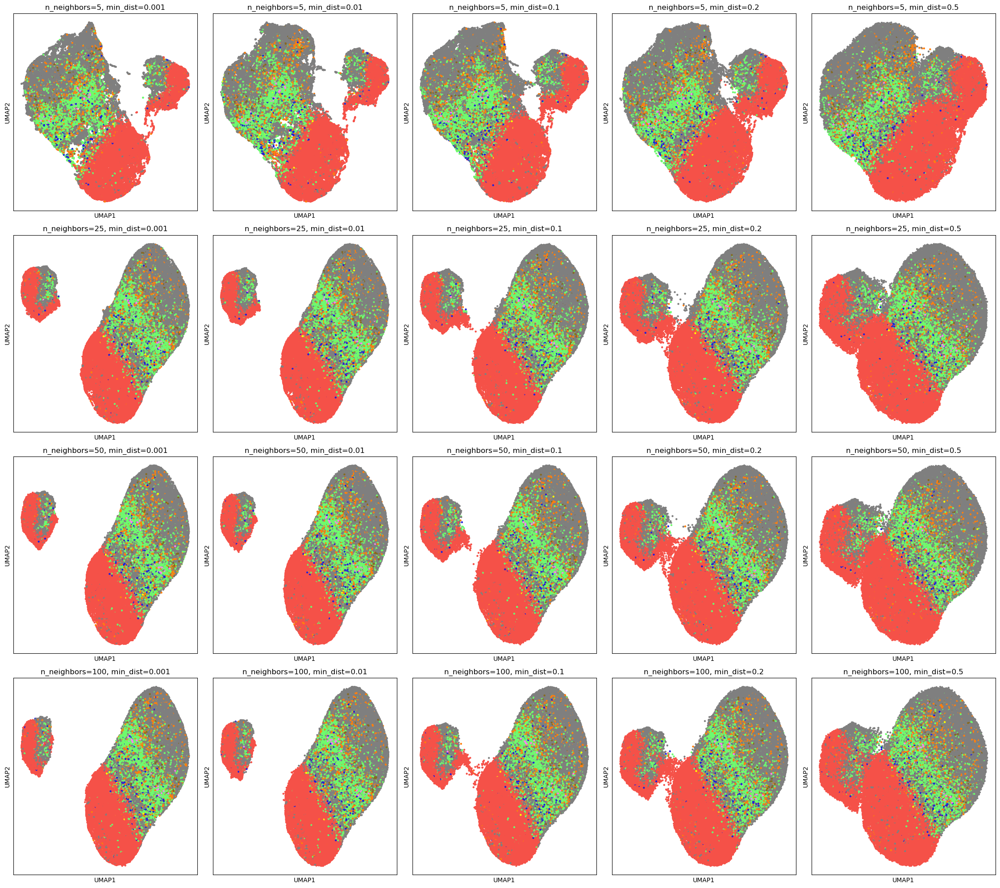

In [138]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=ss_label,
    color_dict=color_dict,
    )

In [139]:
subsample = df.sample(10000)
ss_X = subsample.iloc[:,:-1]
ss_label = subsample.iloc[:,-1]

param_grid = {
    'n_neighbors': [3,5,10, 25],
    'min_dist': [0.0001, 0.001, 0.01, 0.1],
    'n_components': [2],
    'metric': ['euclidean']
}

grid = list(ParameterGrid(param_grid))

results = []
with tqdm(total=len(grid), desc="UMAP grid search") as pbar:
    for params in grid:
        reducer = umap.UMAP(**params)
        embedding = reducer.fit_transform(ss_X)
        results.append({
            'embedding': embedding,
            'params': params,
        })
        
        # Update progress bar with current params (brief version)
        brief_params = {k: params[k] for k in ['n_neighbors', 'min_dist']}
        pbar.set_postfix(brief_params)
        pbar.update(1)

UMAP grid search: 100%|██████████| 16/16 [01:48<00:00,  6.78s/it, n_neighbors=25, min_dist=0.1]  


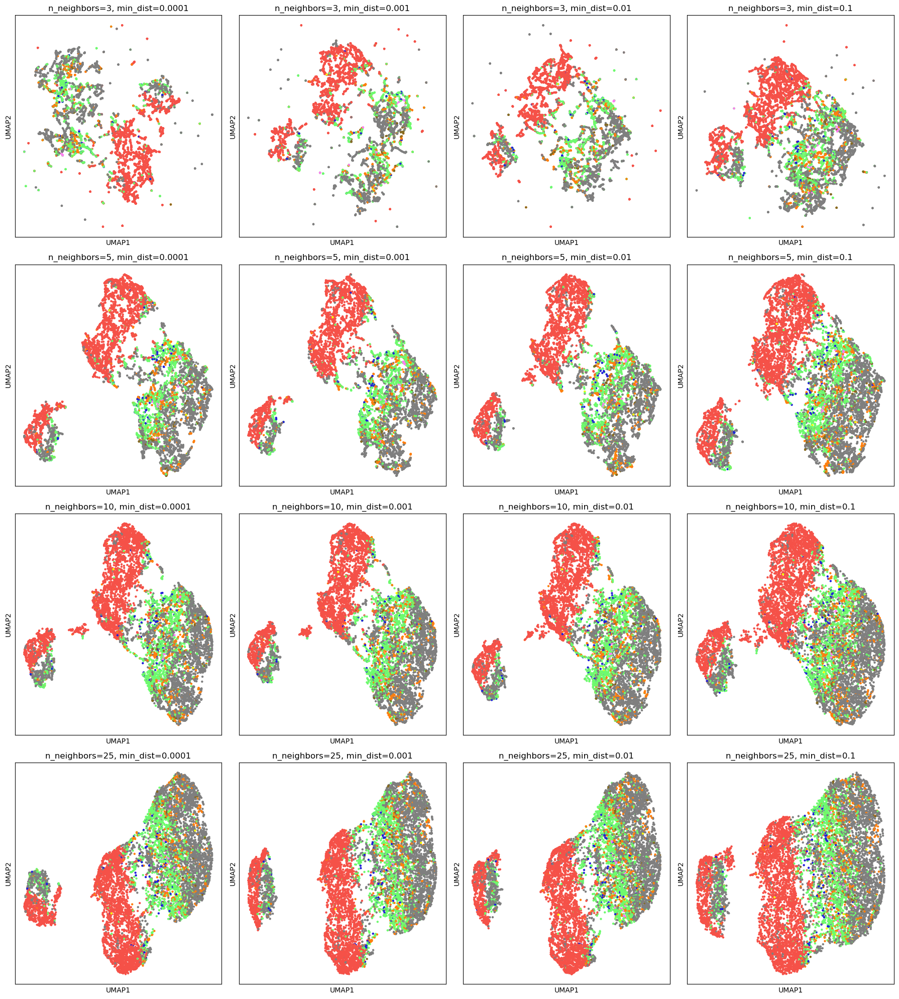

In [140]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=ss_label,
    color_dict=color_dict,
    )

# 14.05.2025 UMAP

### functions 

In [78]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import umap
from sklearn.model_selection import ParameterGrid
from tqdm import tqdm

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)



In [51]:
# match categorical, subsample, split
def match_cat_subsample_split(df, metadata_df, metadata_categorical, metadata_index, subsample):
    df_tmp = pd.merge(left=df, right=metadata_df[[metadata_index,metadata_categorical]], left_index=True, right_on=metadata_index)
    df_subsample = df_tmp.sample(subsample)
    return df_subsample.iloc[:,:-1], df_subsample.iloc[:,-1]

In [ ]:
def run_umap_grid_settings(grid_settings, data):
    
    grid = list(ParameterGrid(grid_settings))

    results = []
    with tqdm(total=len(grid), desc="UMAP grid search") as pbar:
        
        for params in grid:
            reducer = umap.UMAP(**params)
            embedding = reducer.fit_transform(data)
            results.append({
                'embedding': embedding,
                'params': params,
            })
            
            brief_params = {k: params[k] for k in ['n_neighbors', 'min_dist']}
            pbar.set_postfix(brief_params)
            pbar.update(1)

    return results

## raw data, standard scale (zscore)

### 991

In [3]:
adata = ad.read_h5ad("../data/perSample/991/adata_checkpoints/5_filtering_done/20250302_1752_5_filtering_done_adata.h5ad")

In [ ]:
# create data from adata
df_markers = pd.DataFrame(data=adata.X, columns=adata.var_names, index=adata.obs.CellID)
df_markers

,std_750_bg,std_647_bg,std_555_bg,std_488_bg,std_DAPI_bg,std_Vimentin,std_CD3e,std_panCK,std_CD8,std_DAPI_1,...,quantile75_Vimentin,quantile75_CD3e,quantile75_panCK,quantile75_CD8,quantile75_DAPI_1,quantile75_COL1A1,quantile75_CD20,quantile75_CD68,quantile75_Ki67,quantile75_DAPI_2
CellID,,,,,,,,,,,,,,,,,,,,,
1,41.461879,53.659788,49.309493,200.259604,293.016404,17.130015,39.752603,507.595592,142.687713,207.805129,...,26.0,210.0,586.0,778.5,512.5,1010.0,214.0,47.0,0.0,180.0
2,40.490387,57.285263,55.572827,272.513485,100.859416,19.037045,39.202903,160.053639,95.518951,66.822572,...,31.0,200.0,309.5,580.5,301.0,1649.0,327.0,74.0,0.0,150.5
3,37.306977,51.420912,48.657057,202.735215,521.368069,18.545898,180.109307,614.089391,119.210731,372.585199,...,24.0,243.0,1696.0,794.0,1236.0,1123.0,244.0,55.0,0.0,380.0
4,32.089896,46.208358,41.483179,162.604498,512.721100,52.330565,526.061306,12.027664,214.472596,365.062316,...,69.0,602.0,0.0,1144.0,963.5,877.0,337.0,51.0,0.0,298.0
5,40.127534,61.024925,62.499609,348.885138,558.572462,63.805350,224.495425,253.642134,186.853325,388.263525,...,46.0,345.0,623.0,956.0,1233.0,1070.0,291.0,75.0,0.0,360.0


In [ ]:
# append morphodata
columns = ['Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity']
df_morpho = pd.DataFrame(data=adata.obs[columns].values, columns=columns, index=adata.obs["CellID"])
df = pd.merge(left=df_markers, right=df_morpho, left_index=True, right_index=True)
df 

,std_750_bg,std_647_bg,std_555_bg,std_488_bg,std_DAPI_bg,std_Vimentin,std_CD3e,std_panCK,std_CD8,std_DAPI_1,...,quantile75_CD68,quantile75_Ki67,quantile75_DAPI_2,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity
CellID,,,,,,,,,,,,,,,,,,,,,
1,41.461879,53.659788,49.309493,200.259604,293.016404,17.130015,39.752603,507.595592,142.687713,207.805129,...,47.0,0.0,180.0,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615
2,40.490387,57.285263,55.572827,272.513485,100.859416,19.037045,39.202903,160.053639,95.518951,66.822572,...,74.0,0.0,150.5,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109
3,37.306977,51.420912,48.657057,202.735215,521.368069,18.545898,180.109307,614.089391,119.210731,372.585199,...,55.0,0.0,380.0,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602
4,32.089896,46.208358,41.483179,162.604498,512.721100,52.330565,526.061306,12.027664,214.472596,365.062316,...,51.0,0.0,298.0,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406
5,40.127534,61.024925,62.499609,348.885138,558.572462,63.805350,224.495425,253.642134,186.853325,388.263525,...,75.0,0.0,360.0,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743


In [ ]:
df_scaled = pd.DataFrame(
    data=StandardScaler().fit_transform(df), 
    columns=df.columns, index=df.index)
df_scaled

In [ ]:
adata_pheno = ad.read_h5ad("../data/perSample/991/adata_checkpoints/6_phenotyped/20250302_1753_6_phenotyped_adata.h5ad")
data, labels = match_cat_subsample_split(df=df_scaled, metadata_df=adata_pheno.obs, metadata_categorical="phenotype", metadata_index="CellID", subsample=10000)
print(data.shape)
print(labels.shape)
print(labels.value_counts())

In [73]:
params = {'n_neighbors': [3,5,10,25,50], 'min_dist': [0.001, 0.01, 0.1, 0.2, 0.5], 'n_components': [2], 'metric': ['euclidean']}
results = run_umap_grid_settings(grid_settings=params, data=data)

UMAP grid search:   0%|          | 0/25 [00:00<?, ?it/s]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   4%|▍         | 1/25 [00:02<00:51,  2.16s/it, n_neighbors=3, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   8%|▊         | 2/25 [00:03<00:42,  1.86s/it, n_neighbors=5, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding

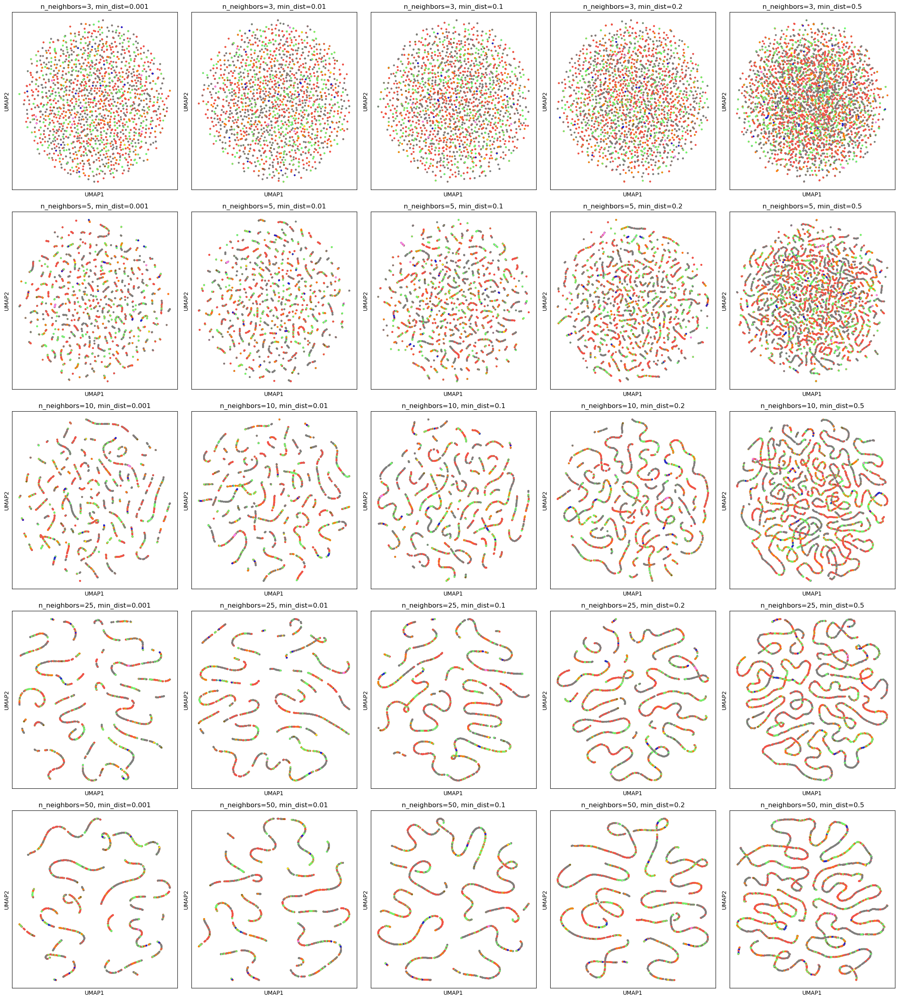

In [ ]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=labels,
    color_dict=color_dict,
    )

In [ ]:
# this fails

## same but min,max

In [75]:
adata = ad.read_h5ad("../data/perSample/991/adata_checkpoints/5_filtering_done/20250302_1752_5_filtering_done_adata.h5ad")

In [76]:
# create data from adata
df_markers = pd.DataFrame(data=adata.X, columns=adata.var_names, index=adata.obs.CellID)
df_markers

,std_750_bg,std_647_bg,std_555_bg,std_488_bg,std_DAPI_bg,std_Vimentin,std_CD3e,std_panCK,std_CD8,std_DAPI_1,...,quantile75_Vimentin,quantile75_CD3e,quantile75_panCK,quantile75_CD8,quantile75_DAPI_1,quantile75_COL1A1,quantile75_CD20,quantile75_CD68,quantile75_Ki67,quantile75_DAPI_2
CellID,,,,,,,,,,,,,,,,,,,,,
1,41.461879,53.659788,49.309493,200.259604,293.016404,17.130015,39.752603,507.595592,142.687713,207.805129,...,26.00,210.00,586.00,778.50,512.5,1010.00,214.00,47.0,0.0,180.00
2,40.490387,57.285263,55.572827,272.513485,100.859416,19.037045,39.202903,160.053639,95.518951,66.822572,...,31.00,200.00,309.50,580.50,301.0,1649.00,327.00,74.0,0.0,150.50
3,37.306977,51.420912,48.657057,202.735215,521.368069,18.545898,180.109307,614.089391,119.210731,372.585199,...,24.00,243.00,1696.00,794.00,1236.0,1123.00,244.00,55.0,0.0,380.00
4,32.089896,46.208358,41.483179,162.604498,512.721100,52.330565,526.061306,12.027664,214.472596,365.062316,...,69.00,602.00,0.00,1144.00,963.5,877.00,337.00,51.0,0.0,298.00
5,40.127534,61.024925,62.499609,348.885138,558.572462,63.805350,224.495425,253.642134,186.853325,388.263525,...,46.00,345.00,623.00,956.00,1233.0,1070.00,291.00,75.0,0.0,360.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685801,38.485352,66.591807,63.226838,430.517158,732.281149,27.139890,96.772639,263.924945,146.264609,475.066378,...,102.00,662.00,249.00,1310.25,956.0,2530.00,319.00,133.0,0.0,327.00
685802,47.780091,59.232044,54.975240,169.889542,634.667067,38.065066,116.151500,477.983507,219.382574,361.719553,...,126.25,507.00,1039.25,2215.00,1168.0,1045.00,251.00,84.0,0.0,310.00
685803,49.075153,63.727945,55.835855,159.275846,691.710118,121.683879,499.780392,21.016286,496.552850,457.859822,...,338.25,1858.50,23.00,2373.25,1152.0,1691.25,309.00,135.0,0.0,380.50


In [77]:
# append morphodata
columns = ['Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity']
df_morpho = pd.DataFrame(data=adata.obs[columns].values, columns=columns, index=adata.obs["CellID"])
df = pd.merge(left=df_markers, right=df_morpho, left_index=True, right_index=True)
df 

,std_750_bg,std_647_bg,std_555_bg,std_488_bg,std_DAPI_bg,std_Vimentin,std_CD3e,std_panCK,std_CD8,std_DAPI_1,...,quantile75_CD68,quantile75_Ki67,quantile75_DAPI_2,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity
CellID,,,,,,,,,,,,,,,,,,,,,
1,41.461879,53.659788,49.309493,200.259604,293.016404,17.130015,39.752603,507.595592,142.687713,207.805129,...,47.0,0.0,180.00,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615
2,40.490387,57.285263,55.572827,272.513485,100.859416,19.037045,39.202903,160.053639,95.518951,66.822572,...,74.0,0.0,150.50,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109
3,37.306977,51.420912,48.657057,202.735215,521.368069,18.545898,180.109307,614.089391,119.210731,372.585199,...,55.0,0.0,380.00,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602
4,32.089896,46.208358,41.483179,162.604498,512.721100,52.330565,526.061306,12.027664,214.472596,365.062316,...,51.0,0.0,298.00,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406
5,40.127534,61.024925,62.499609,348.885138,558.572462,63.805350,224.495425,253.642134,186.853325,388.263525,...,75.0,0.0,360.00,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685801,38.485352,66.591807,63.226838,430.517158,732.281149,27.139890,96.772639,263.924945,146.264609,475.066378,...,133.0,0.0,327.00,1080.0,56.372404,25.352581,0.893163,1.002754,141.610173,0.961710
685802,47.780091,59.232044,54.975240,169.889542,634.667067,38.065066,116.151500,477.983507,219.382574,361.719553,...,84.0,0.0,310.00,1076.0,41.856049,34.076776,0.580666,1.330143,129.396970,0.951370
685803,49.075153,63.727945,55.835855,159.275846,691.710118,121.683879,499.780392,21.016286,496.552850,457.859822,...,135.0,0.0,380.50,768.0,33.256837,29.969709,0.433488,0.983058,105.254834,0.957606


In [79]:
df_scaled = pd.DataFrame(
    data=MinMaxScaler().fit_transform(df), 
    columns=df.columns, index=df.index)
df_scaled

,std_750_bg,std_647_bg,std_555_bg,std_488_bg,std_DAPI_bg,std_Vimentin,std_CD3e,std_panCK,std_CD8,std_DAPI_1,...,quantile75_CD68,quantile75_Ki67,quantile75_DAPI_2,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity
CellID,,,,,,,,,,,,,,,,,,,,,
1,0.014926,0.004426,0.009404,0.019788,0.087230,0.004170,0.009130,0.072852,0.022857,0.047692,...,0.005593,0.0,0.039675,0.243202,0.635682,0.270999,0.969196,0.014584,0.481331,0.418507
2,0.014261,0.005008,0.011901,0.031389,0.026376,0.004634,0.009004,0.022972,0.015301,0.013018,...,0.008806,0.0,0.031547,0.253644,0.228982,0.400706,0.620663,0.550931,0.232230,0.967454
3,0.012084,0.004067,0.009144,0.020186,0.159546,0.004515,0.041366,0.088137,0.019097,0.088219,...,0.006545,0.0,0.094779,0.135741,0.143535,0.321907,0.528427,0.389660,0.178409,0.880086
4,0.008516,0.003230,0.006284,0.013742,0.156807,0.012739,0.120820,0.001726,0.034357,0.086368,...,0.006069,0.0,0.072186,0.198825,0.318514,0.236022,0.902650,0.039377,0.240158,0.916508
5,0.014013,0.005609,0.014663,0.043652,0.171328,0.015532,0.051560,0.036404,0.029932,0.092075,...,0.008925,0.0,0.089268,0.708070,0.513372,0.654609,0.740551,0.579961,0.527224,0.878506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685801,0.012890,0.006502,0.014952,0.056758,0.226339,0.006607,0.022226,0.037880,0.023430,0.113424,...,0.015827,0.0,0.080176,0.147705,0.279106,0.195043,0.909245,0.819187,0.210104,0.942813
685802,0.019247,0.005321,0.011663,0.014912,0.195426,0.009266,0.026677,0.068602,0.035143,0.085546,...,0.009996,0.0,0.075492,0.146835,0.156808,0.320208,0.582892,0.923399,0.172047,0.923798
685803,0.020132,0.006043,0.012006,0.013208,0.213491,0.029621,0.114785,0.003016,0.079543,0.109192,...,0.016065,0.0,0.094917,0.079835,0.084360,0.261284,0.429189,0.812918,0.096819,0.935266


In [80]:
adata_pheno = ad.read_h5ad("../data/perSample/991/adata_checkpoints/6_phenotyped/20250302_1753_6_phenotyped_adata.h5ad")
data, labels = match_cat_subsample_split(df=df_scaled, metadata_df=adata_pheno.obs, metadata_categorical="phenotype", metadata_index="CellID", subsample=10000)
print(data.shape)
print(labels.shape)
print(labels.value_counts())

(10000, 83)
(10000,)
phenotype
Cancer_cells      3565
Unknown           3556
CD4_Tcells        1784
COL1A1_cells       736
CD8_Tcells         168
Vimentin_cells     112
B_cells             60
Macrophages         19
Name: count, dtype: int64


In [81]:
params = {'n_neighbors': [3,5,10,25,50], 'min_dist': [0.001, 0.01, 0.1, 0.2, 0.5], 'n_components': [2], 'metric': ['euclidean']}
results = run_umap_grid_settings(grid_settings=params, data=data)

UMAP grid search:   0%|          | 0/25 [00:00<?, ?it/s]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   4%|▍         | 1/25 [00:02<00:55,  2.32s/it, n_neighbors=3, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   8%|▊         | 2/25 [00:03<00:43,  1.90s/it, n_neighbors=5, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding

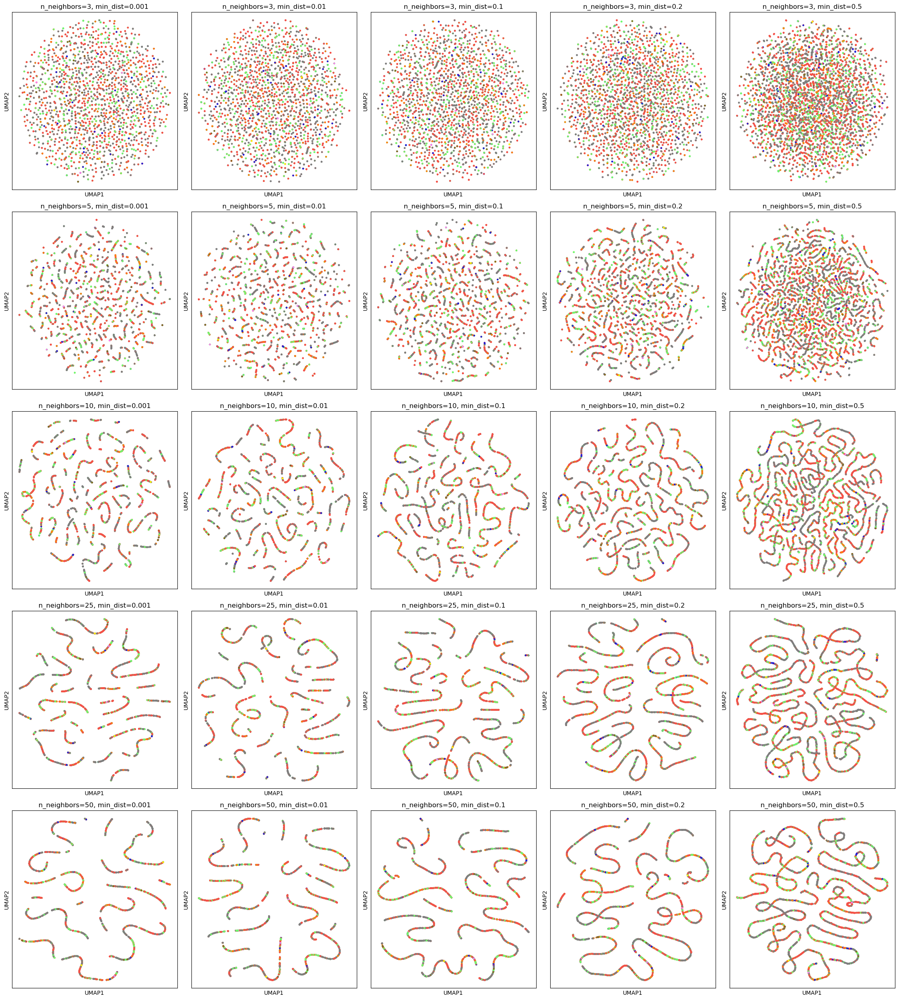

In [82]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=labels,
    color_dict=color_dict,
    )

In [ ]:
## scaling does not help

In [ ]:
# posibly feature selection helps, too many features, too noisy

## Let's try phenotyped data only, without morpho

In [83]:
adata_991 = ad.read_h5ad("../data/perSample/991/adata_checkpoints/7_adata_pheno/20250302_1823_7_adata_pheno_adata.h5ad")

In [84]:
# create data from adata
df_markers = pd.DataFrame(data=adata_991.X, columns=adata_991.var_names, index=adata_991.obs.CellID)
df_markers

,mean_Vimentin,mean_CD3e,mean_panCK,mean_CD8,mean_COL1A1,mean_CD20,mean_CD68,mean_Ki67
CellID,,,,,,,,
1,0.217430,0.445292,0.706378,0.443221,0.457555,0.392043,0.299051,0.000000
2,0.232569,0.441189,0.635352,0.423866,0.542440,0.425889,0.338904,0.000000
3,0.215473,0.466213,0.794898,0.445378,0.473647,0.402801,0.311815,0.000000
4,0.309152,0.556337,0.227288,0.466315,0.443738,0.431272,0.305019,0.000000
5,0.290441,0.483283,0.701336,0.456075,0.467879,0.413881,0.338755,0.000000
...,...,...,...,...,...,...,...,...
685801,0.349347,0.580561,0.616782,0.481668,0.648872,0.418773,0.394006,0.005254
685802,0.365076,0.540715,0.739696,0.554223,0.465899,0.404583,0.345634,0.000000
685803,0.440463,0.730069,0.339847,0.553126,0.552363,0.418617,0.399508,0.000000


In [86]:
data, labels = match_cat_subsample_split(
    df=df_markers, 
    metadata_df=adata_991.obs, 
    metadata_categorical="phenotype", 
    metadata_index="CellID", 
    subsample=10000)

In [88]:
params = {'n_neighbors': [3,5,10,25,50], 'min_dist': [0.001, 0.01, 0.1, 0.2, 0.5], 'n_components': [2], 'metric': ['euclidean']}
results = run_umap_grid_settings(grid_settings=params, data=data)

UMAP grid search:   0%|          | 0/25 [00:00<?, ?it/s]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   4%|▍         | 1/25 [00:02<00:55,  2.32s/it, n_neighbors=3, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
UMAP grid search:   8%|▊         | 2/25 [00:03<00:44,  1.93s/it, n_neighbors=5, min_dist=0.001]/Users/jnimoca/Jose_BI/4_Projects/P26_BCCN/P26E10_E11_ImageAnalysis/.pixi/envs/default/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding

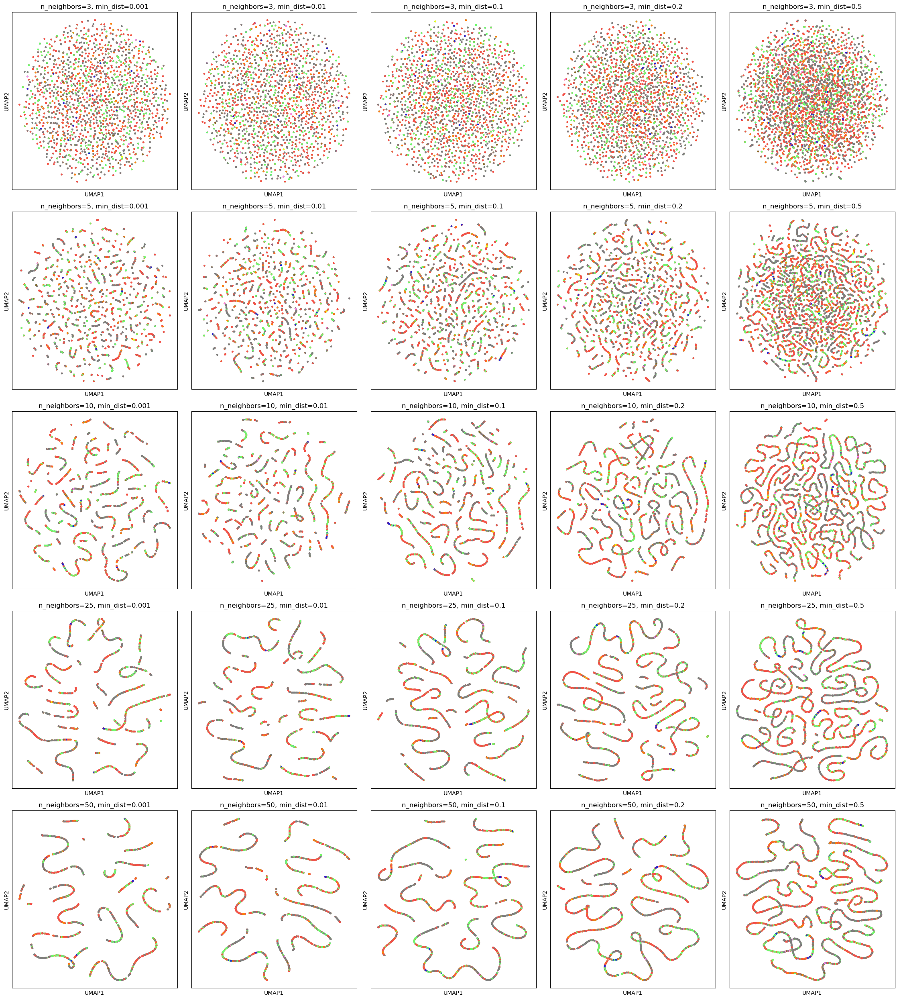

In [90]:
plot_umap_grid_results(
    grid_results=results,
    param_names=("n_neighbors", "min_dist"),
    color_series=labels,
    color_dict=color_dict,
    )

# Tests

## Test 1: rawdata, all metrics, + morpho metrics, standardscale

## Test 2: rawdata, all metrics + morpho metrics, minmaxscale

## Test 3: rawdata, all metrics + morpho metrics, PCA

### screeplot, 2-5 PCs

## Test 4: rawdata, all metrics, standardscale

## Test 5: rawdata, all metrics, minmaxscale

## Test 6: rawdata, all metrics, PCA